<a href="https://colab.research.google.com/github/akshat2635/auto-eval/blob/main/auto_eval_ocr.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
!pip install easyocr

In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
# required modules
import numpy as np
import pandas as pd
import cv2
import matplotlib.pyplot as plt
import os
import shutil
import PIL.Image
from PIL import Image

In [5]:
dir="/content/drive/MyDrive/Train_Samples_V0"
arr=[]
imgs=[]
for root,dirs,files in os.walk(dir):
    for file in files:
        path=dir+"/"+file
        arr.append(path)
        img=cv2.imread(path)
        # img=cv2.resize(img,(1700,2000))
        img=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        # plt.imshow(img,cmap='gray')
        print(img.shape)
        # break;
        imgs.append(img)

(8042, 6886)
(8067, 6877)
(7981, 6863)
(7929, 6887)
(8160, 6930)
(7825, 6860)
(7955, 6898)
(8059, 6916)
(7996, 6857)
(7881, 6882)
(7923, 6913)
(7821, 6897)
(7789, 6864)
(7812, 6826)
(7888, 6839)
(7831, 6878)
(8026, 6862)
(8076, 6889)
(7865, 6842)
(7838, 6895)
(7796, 6871)
(8099, 6917)
(7804, 6902)
(7763, 6865)
(7911, 6877)
(7826, 6859)
(7980, 6911)
(7924, 6884)


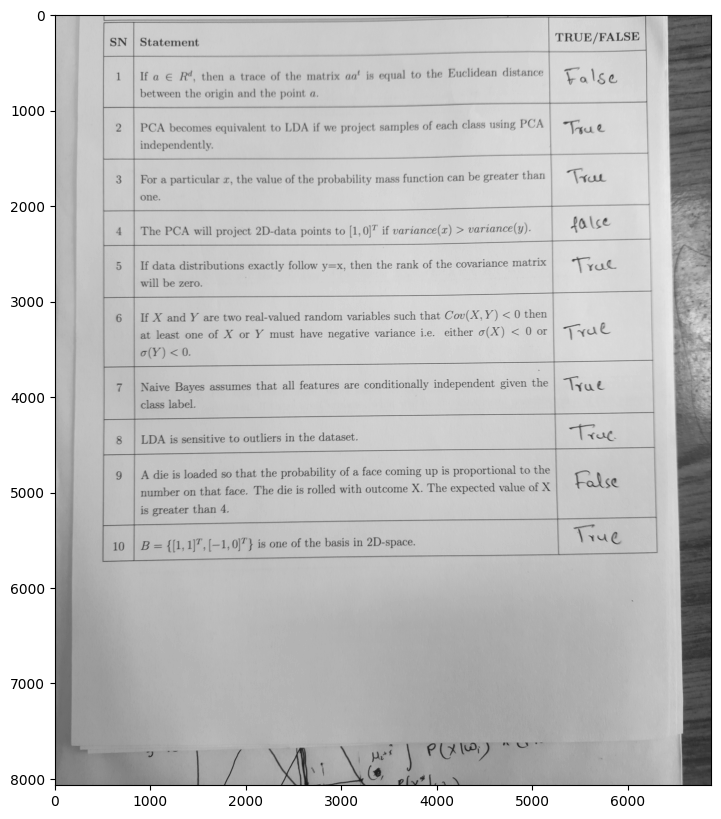

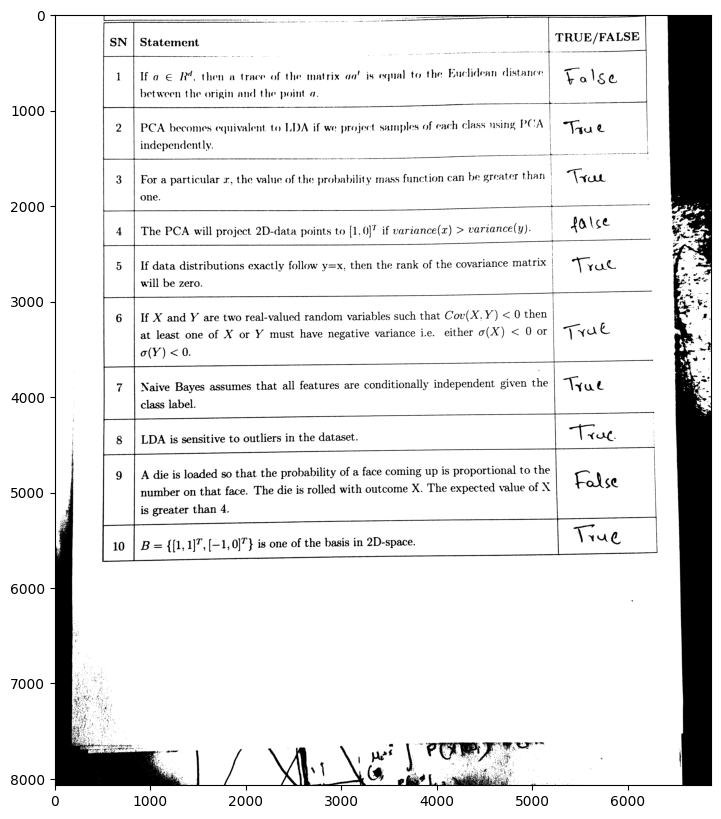

In [6]:
def preprocess_image(img):

    # Apply thresholding to binarize the image
    _, binary_img = cv2.threshold(img, 128, 255, cv2.THRESH_BINARY)

    # Apply morphological operations to enhance the text
    kernel = np.ones((3, 3), np.uint8)
    morphed_img = cv2.morphologyEx(binary_img, cv2.MORPH_CLOSE, kernel)

    return morphed_img
plt.figure(figsize = (15,10))
plt.imshow(imgs[1],cmap='gray')
plt.show()
plt.figure(figsize = (15,10))
plt.imshow(preprocess_image(imgs[1]),cmap='gray')

In [7]:
import easyocr
from pylab import rcParams
from IPython.display import Image

In [8]:
reader = easyocr.Reader(['en'],gpu = True)

Progress: |██████████████████████████████████████████████████| 100.0% Complete

Progress: |██████████████████████████████████████████████████| 100.0% Complete

In [52]:
def extract_tf(image1,path):
    image=image1.copy()
    image=preprocess_image(image)
    res = reader.readtext(path)
    height,width=image.shape[:2]
    bound=width
    cur=1
    texts=[]
    cropped_images = []
    for (bbox, text, prob) in res:
        # cur+=1
    # unpack the bounding box
        (tl, tr, br, bl) = bbox
        tl = (int(tl[0]), int(tl[1]))
        tr = (int(tr[0]), int(tr[1]))
        br = (int(br[0]), int(br[1]))
        bl = (int(bl[0]), int(bl[1]))
        #   print(tl,bound)
        if(cur==1 and ('TRUE' in text)):
            bound=tl[0]-50
            cur=0
            continue

        if(tl[0]>bound):
            # print(text)
            cv2.putText(image,text, (tl[0]+600, tl[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
            if text[0]=='T' or text[0]=='t':
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image,"True", (tl[0], tl[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                texts.append('True')
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)

            else:
                cv2.rectangle(image, tl, br, (0, 255, 0), 8)
                cv2.putText(image, "False", (tl[0], tl[1] - 10),cv2.FONT_HERSHEY_SIMPLEX, 5, (0, 255, 0), 5)
                texts.append('False')
                cropped_img = image[tl[1]:br[1], tl[0]:br[0]]
                cropped_images.append(cropped_img)

    return image,cropped_images,texts,bound
def display_images(images):
    n = len(images)
    # print(n)
    plt.figure(figsize=(6, 3))
    for i in range(0,min(n,10)):
        plt.subplot(2, 5, i+1)
        plt.imshow(images[i], cmap='gray')
        # plt.title(titles[i])
        plt.axis('off')
    plt.show()

['True', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'True', 'False']


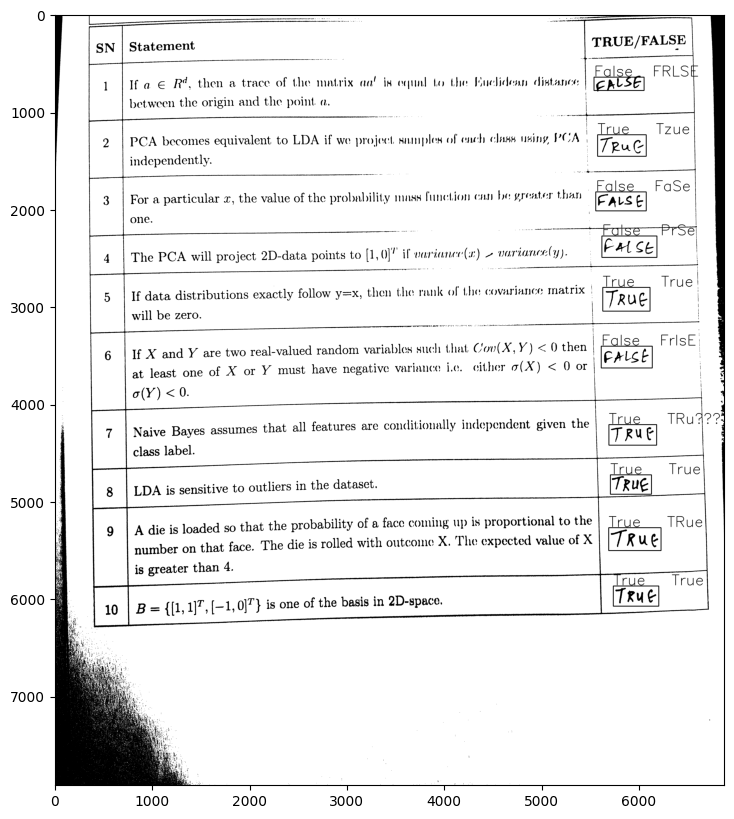

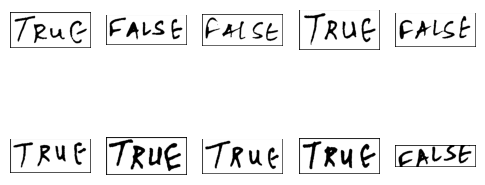

In [53]:
img,cur,texts,bound=extract_tf(imgs[24],arr[24])
print(texts)
plt.figure(figsize=(10,10))
plt.imshow(img,cmap='gray')
plt.show()
display_images(cur)

1


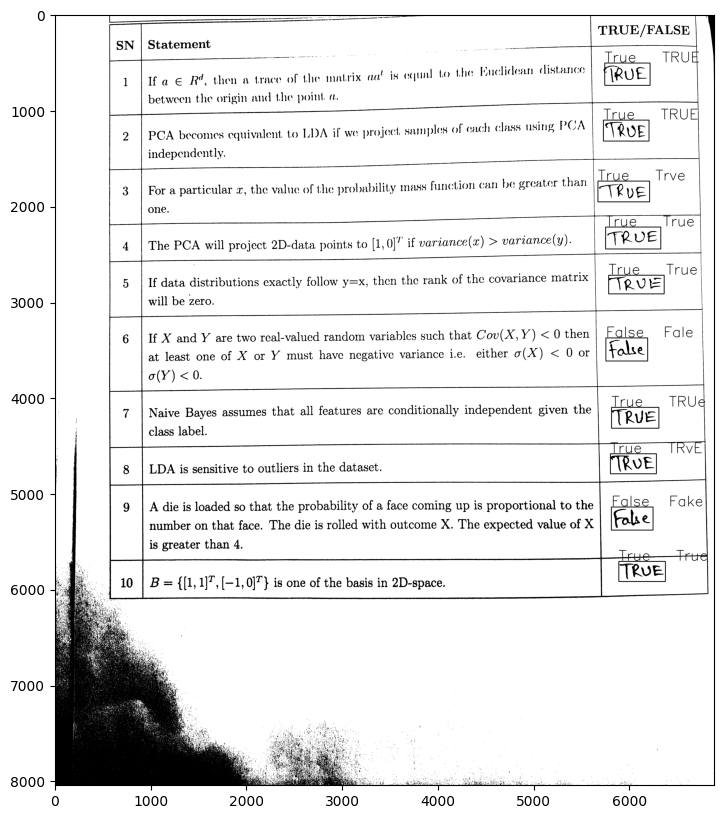

10 ['True', 'True', 'True', 'True', 'True', 'False', 'True', 'True', 'False', 'True']


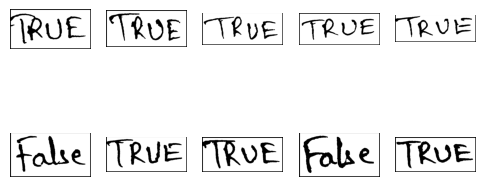

2


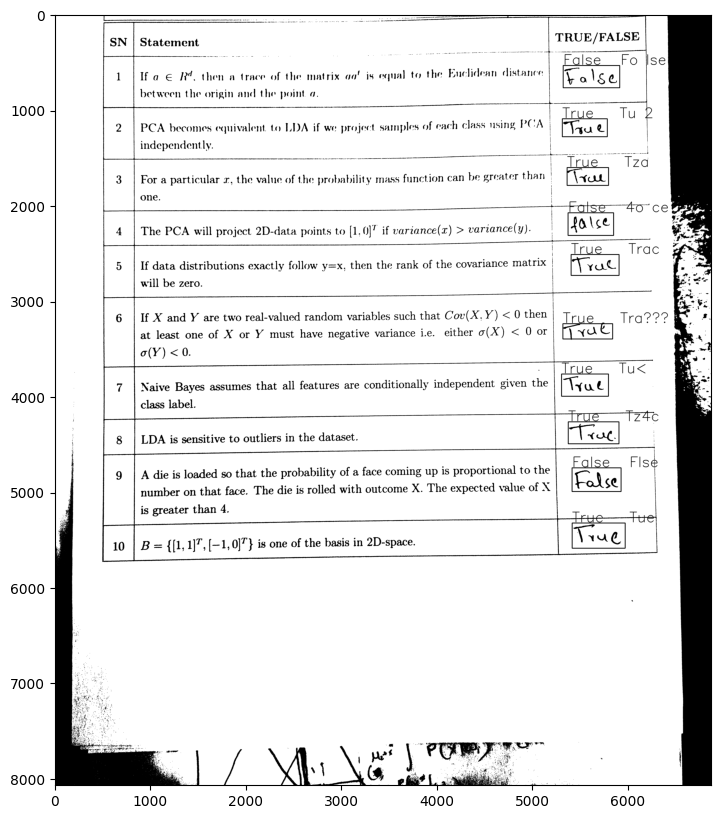

10 ['False', 'True', 'True', 'False', 'True', 'True', 'True', 'False', 'True', 'True']


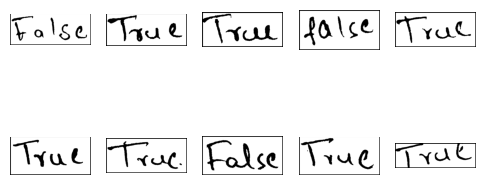

3


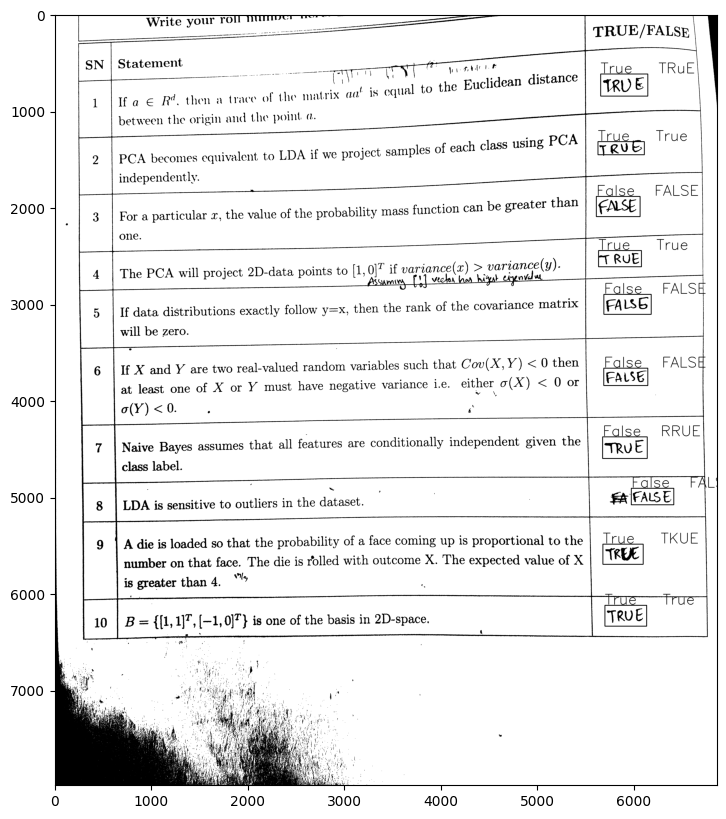

10 ['True', 'False', 'True', 'False', 'False', 'False', 'False', 'True', 'True', 'True']


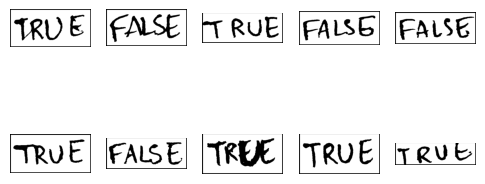

4


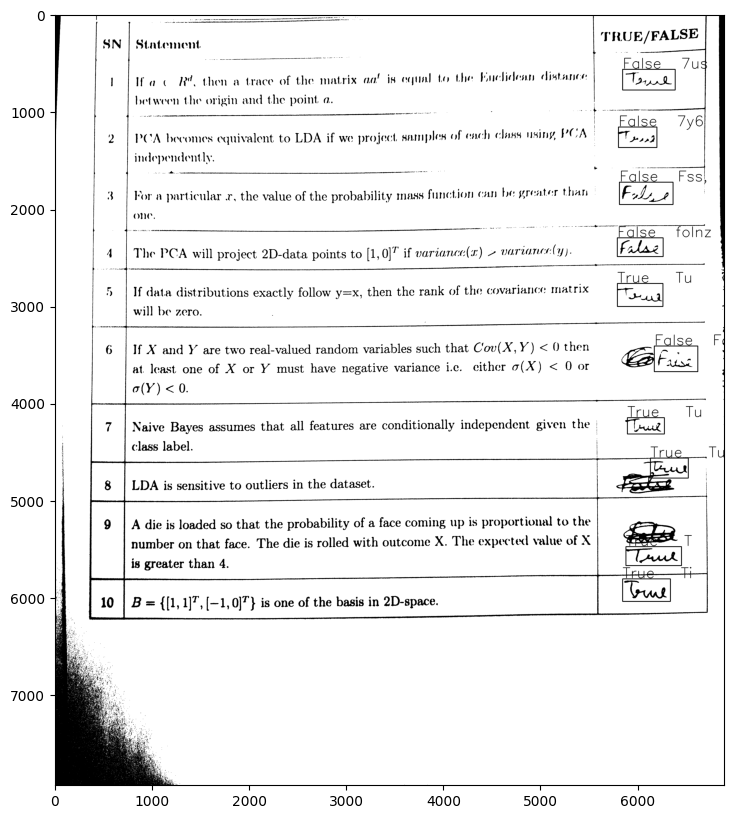

10 ['False', 'False', 'False', 'False', 'True', 'True', 'True', 'False', 'True', 'True']


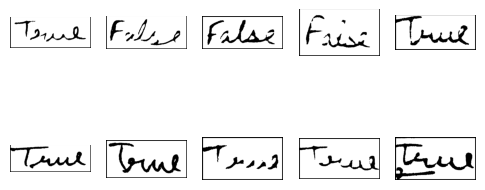

5


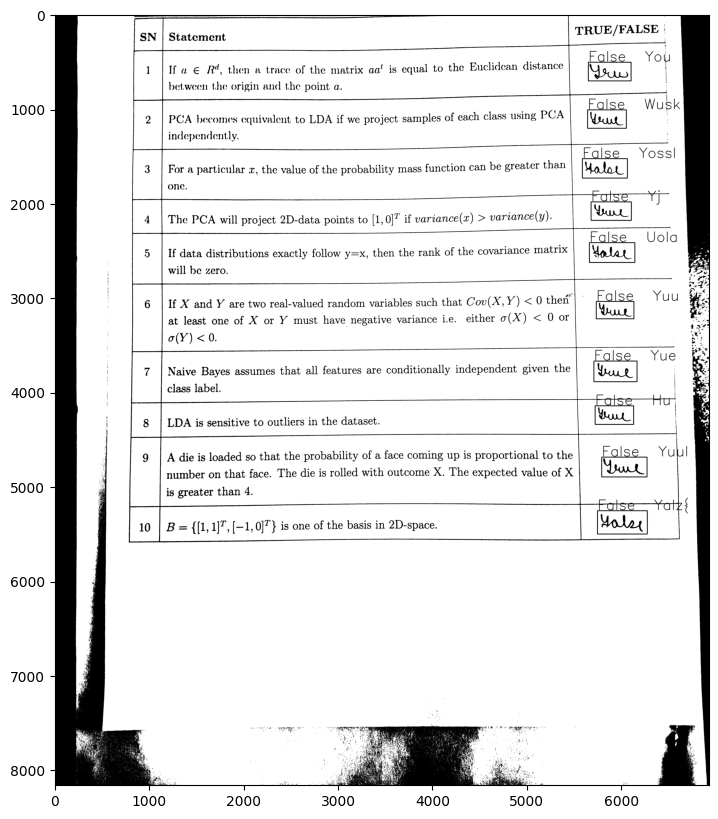

10 ['False', 'False', 'False', 'False', 'False', 'False', 'False', 'False', 'False', 'False']


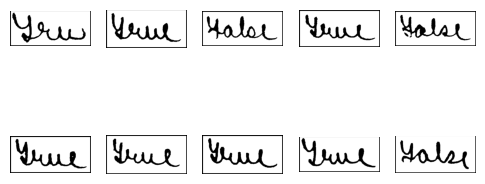

6


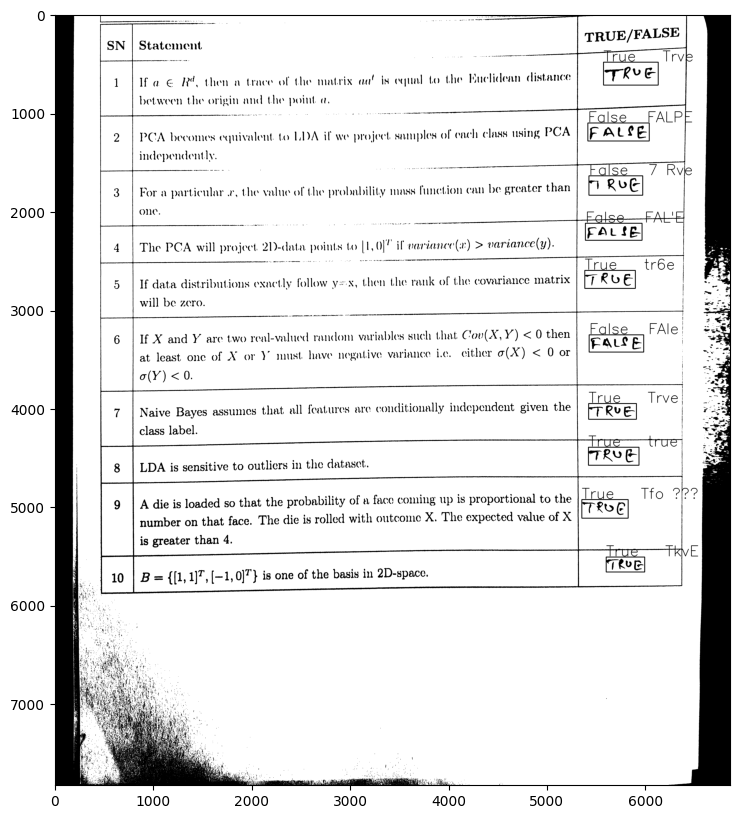

10 ['True', 'False', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'True']


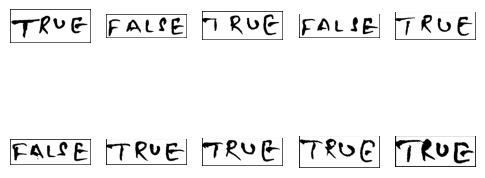

7


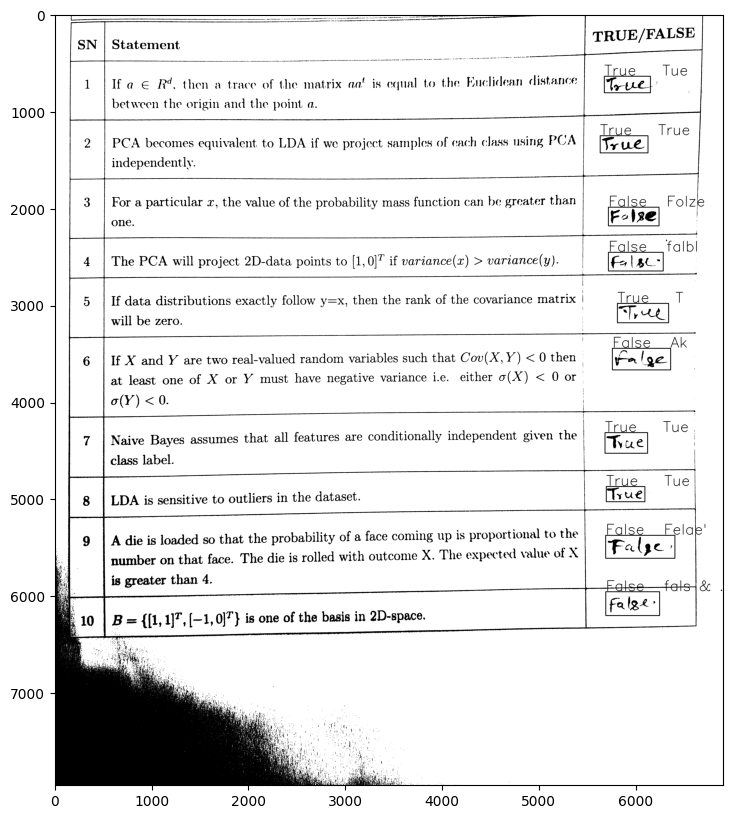

10 ['True', 'True', 'False', 'False', 'True', 'False', 'True', 'True', 'False', 'False']


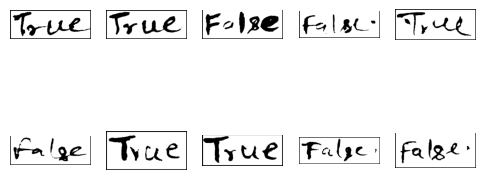

8


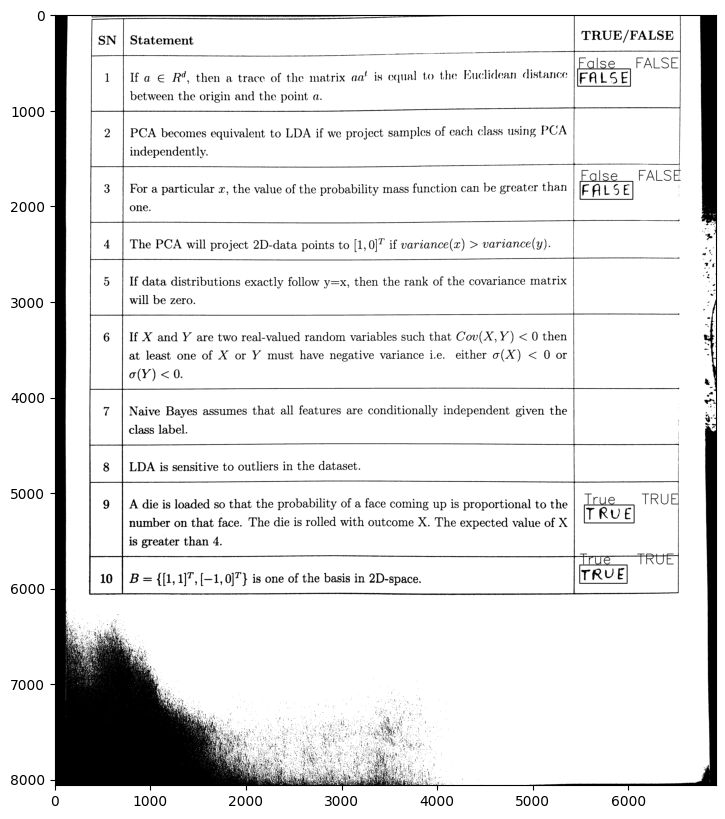

4 ['False', 'False', 'True', 'True']


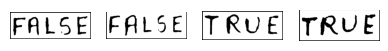

9


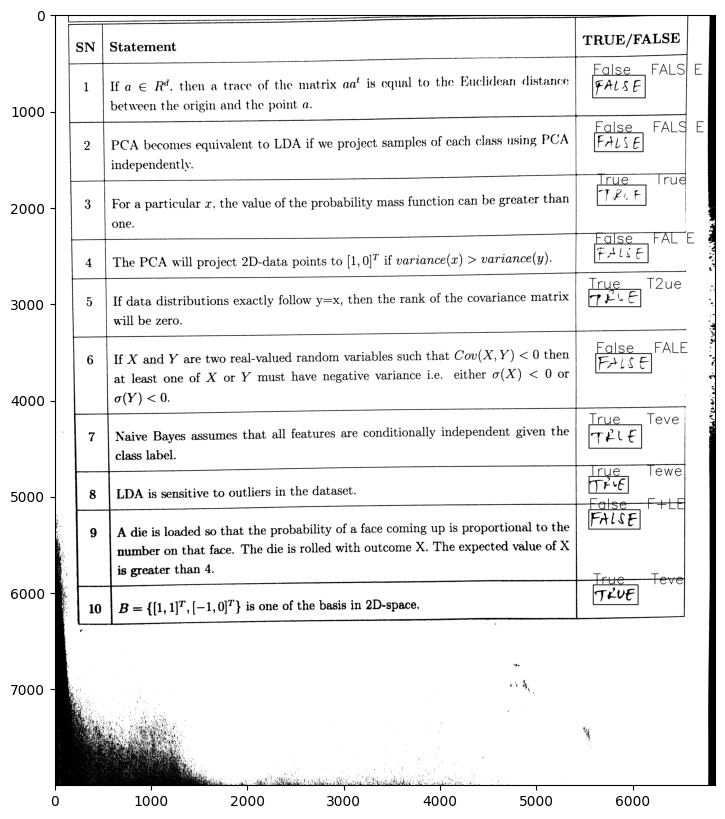

10 ['False', 'False', 'True', 'False', 'False', 'True', 'False', 'True', 'True', 'True']


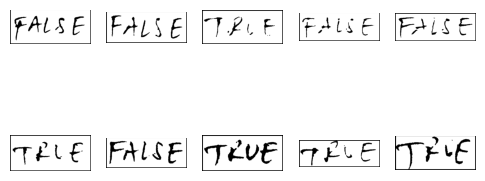

10


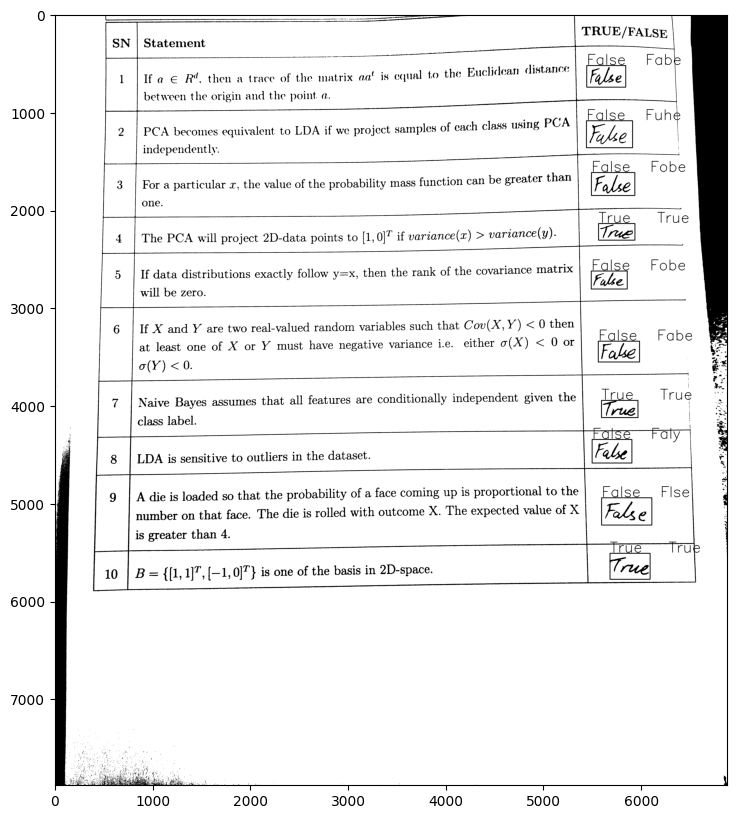

10 ['False', 'False', 'False', 'True', 'False', 'False', 'True', 'False', 'False', 'True']


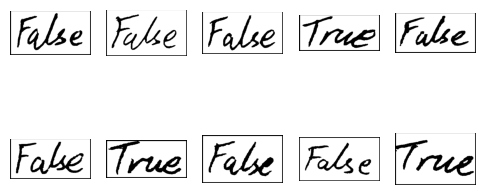

11


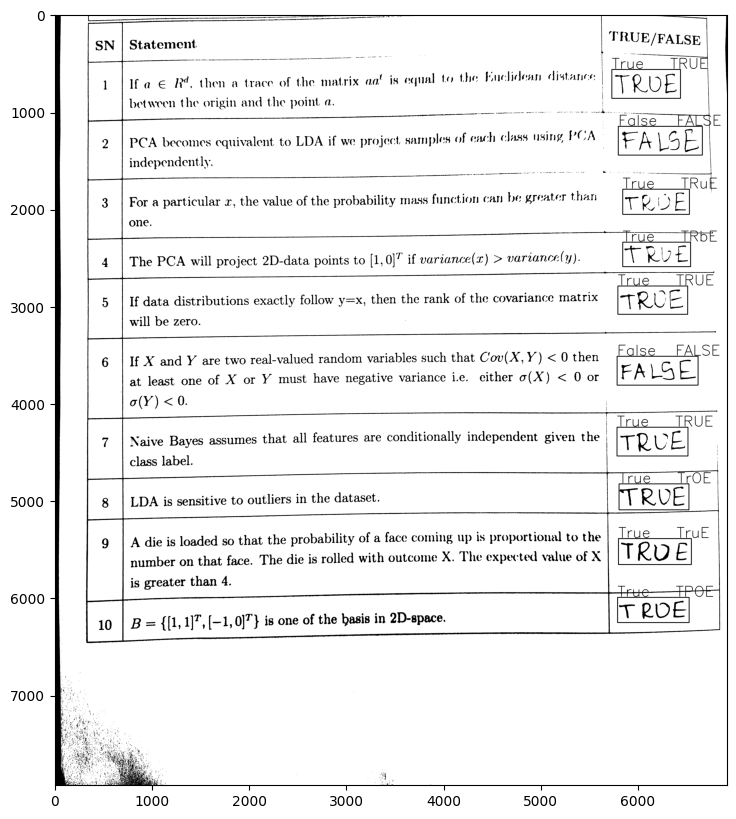

10 ['True', 'False', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'True']


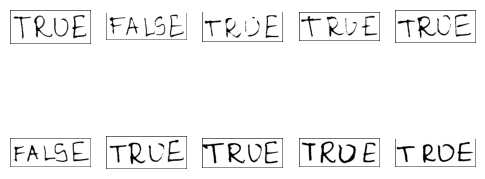

12


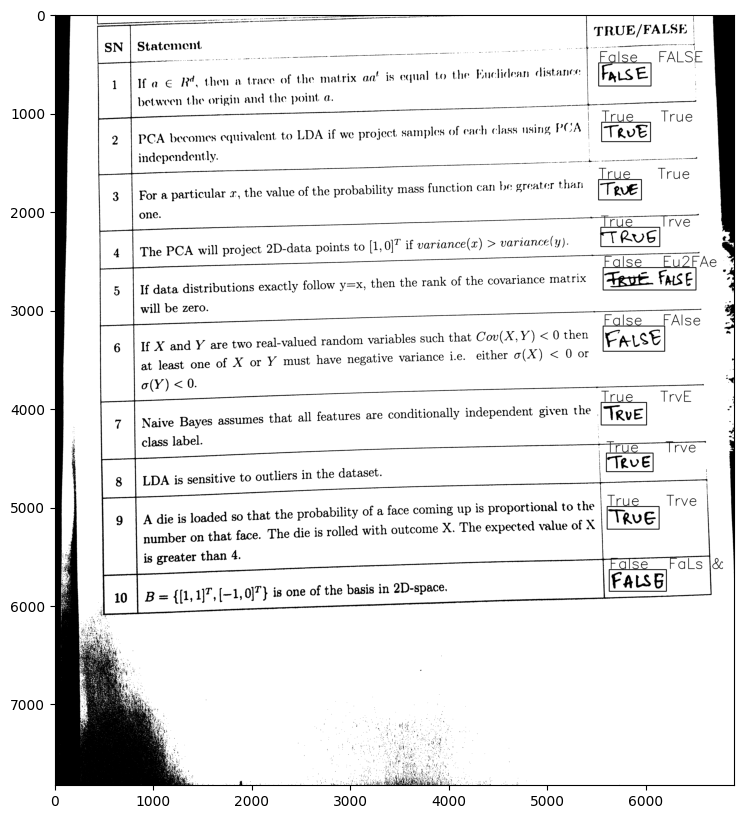

10 ['False', 'True', 'True', 'True', 'False', 'False', 'True', 'True', 'True', 'False']


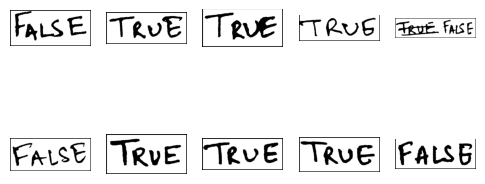

13


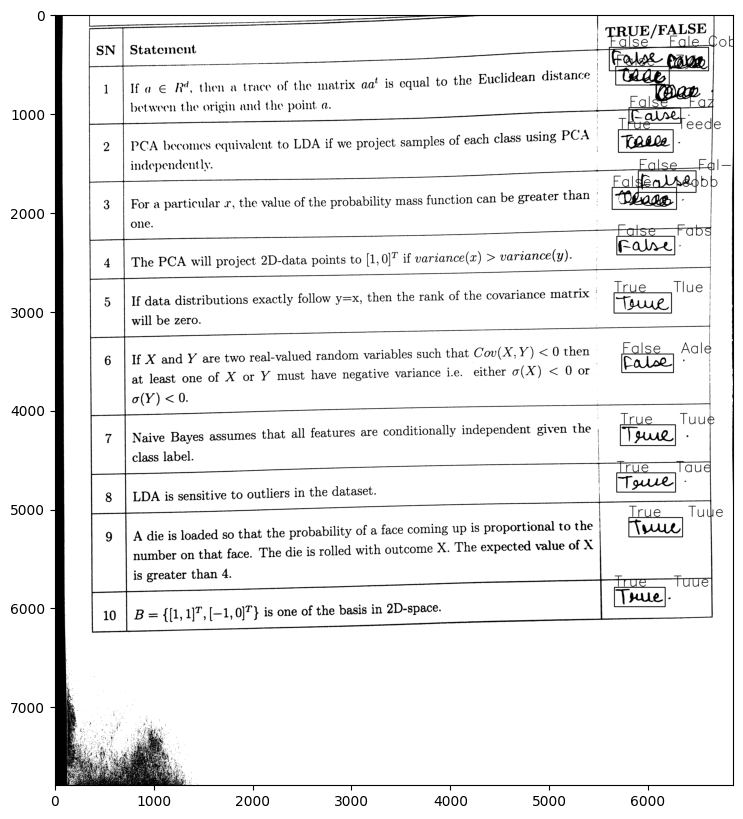

13 ['False', 'False', 'False', 'True', 'False', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'True']


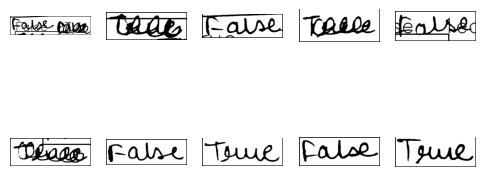

14


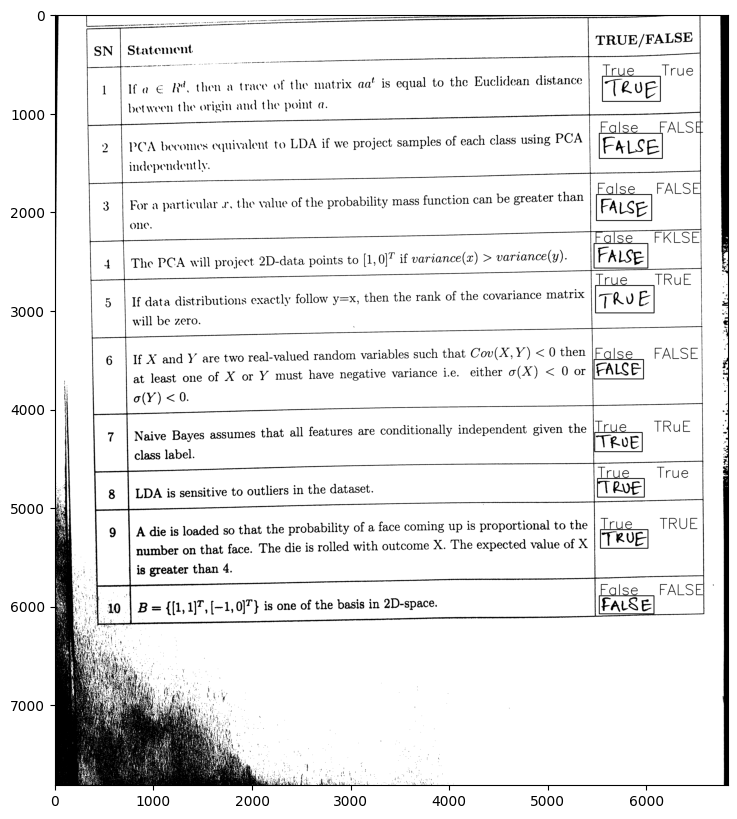

10 ['True', 'False', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'False']


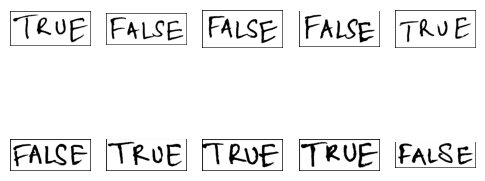

15


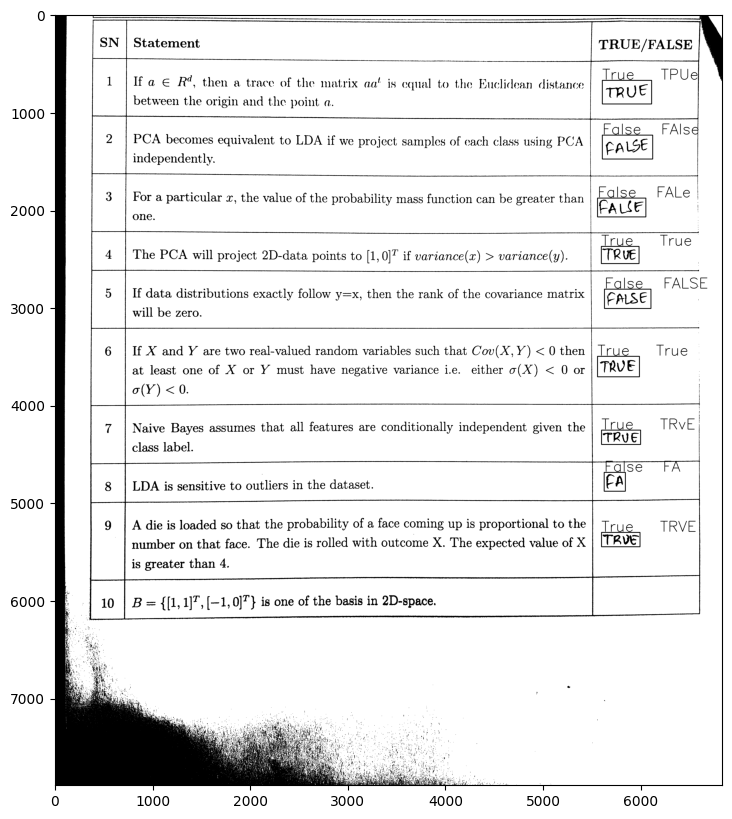

9 ['True', 'False', 'False', 'True', 'False', 'True', 'True', 'False', 'True']


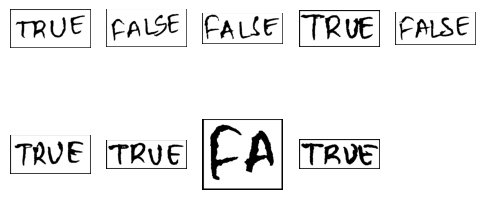

16


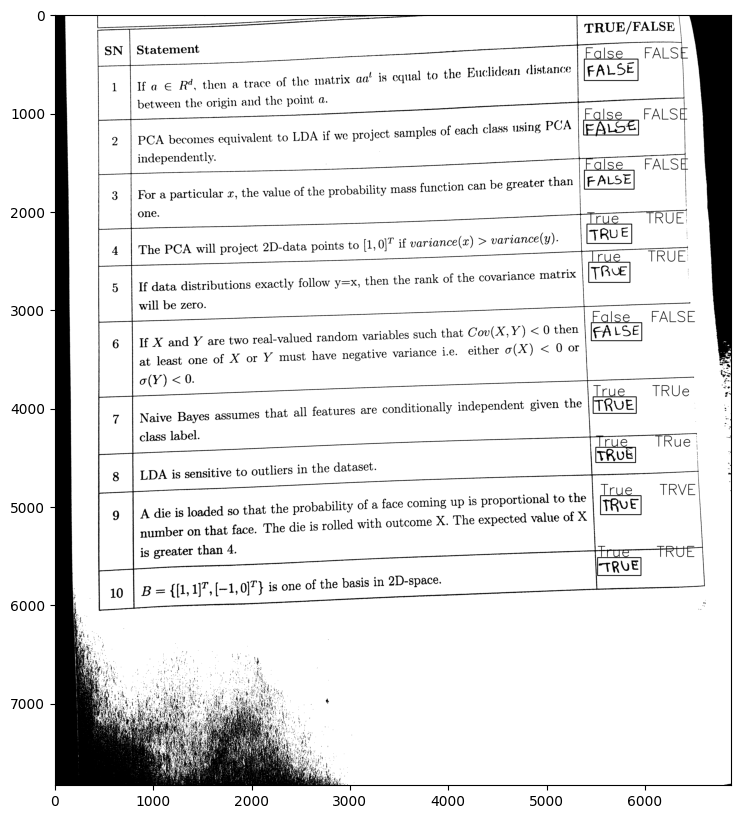

10 ['False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'False', 'True']


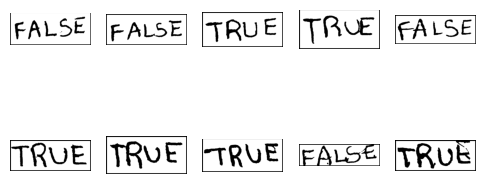

17


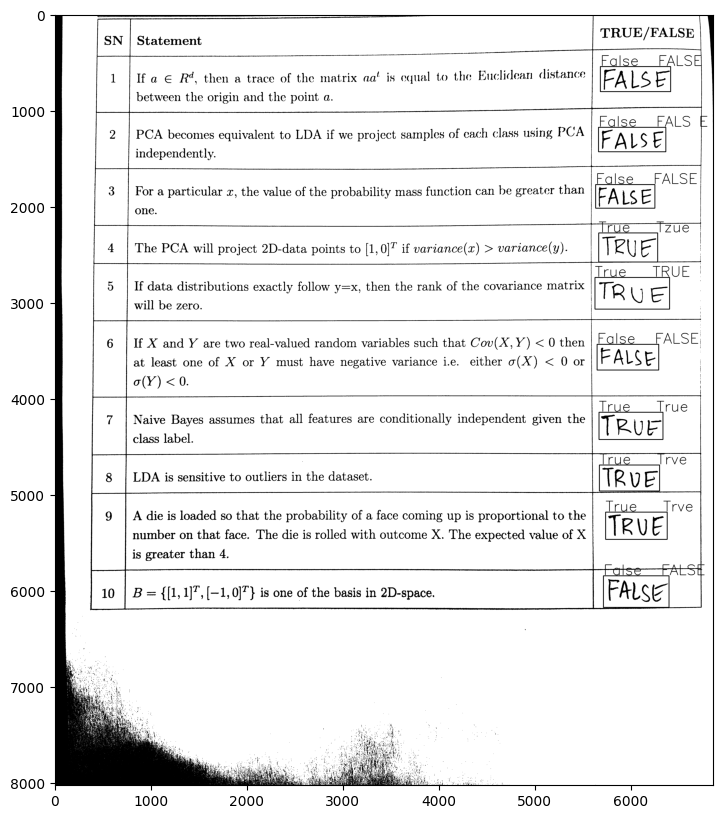

10 ['False', 'False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


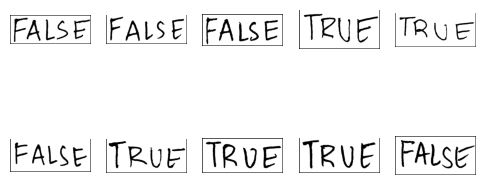

18


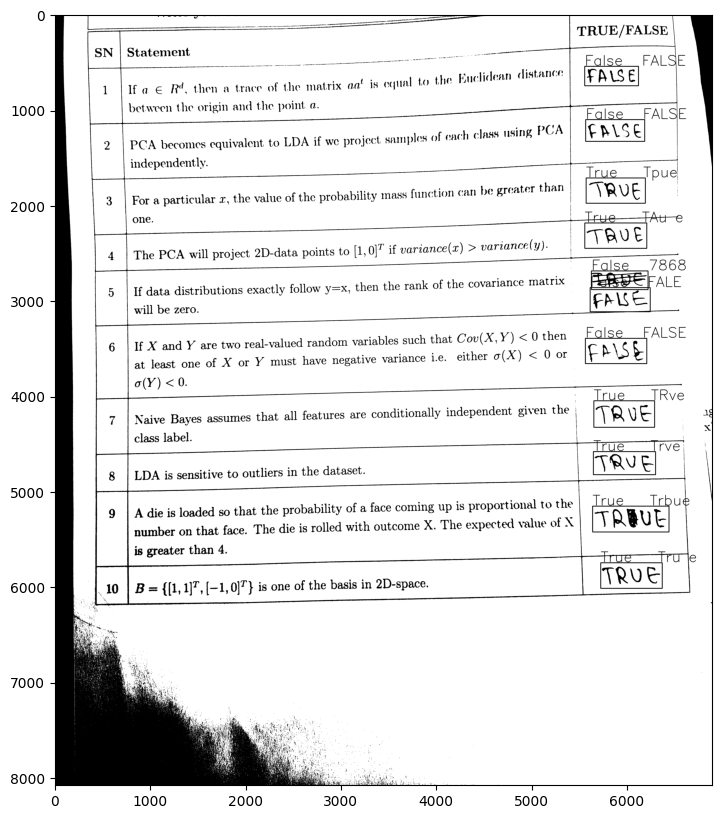

11 ['False', 'False', 'True', 'True', 'False', 'False', 'False', 'True', 'True', 'True', 'True']


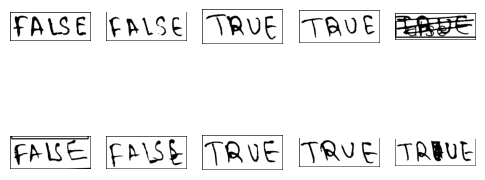

19


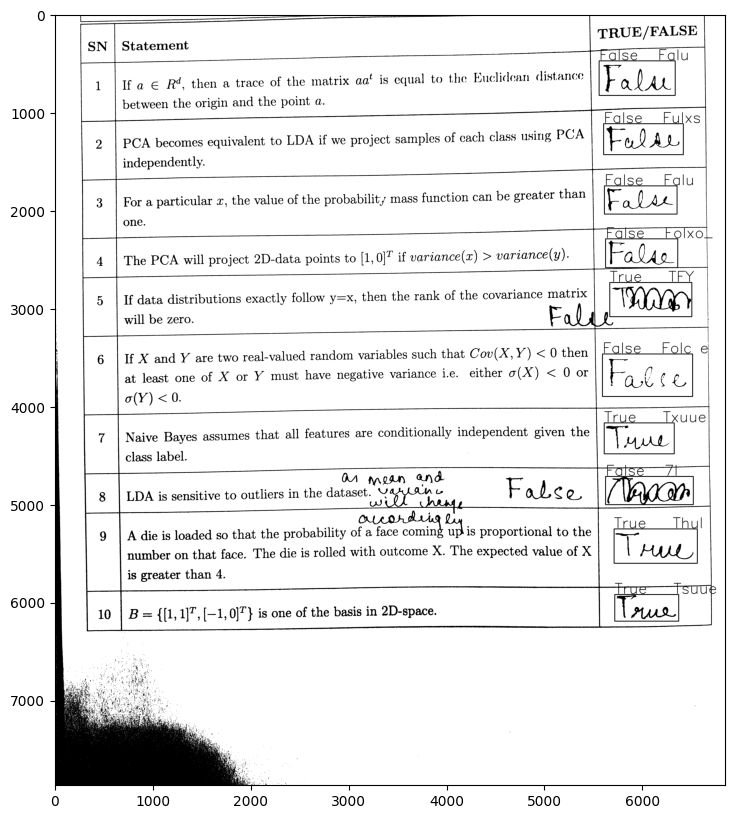

10 ['False', 'False', 'False', 'False', 'True', 'False', 'True', 'False', 'True', 'True']


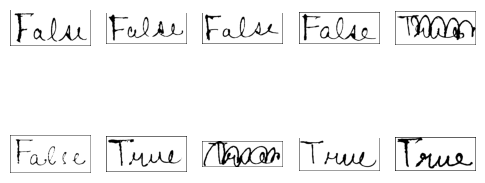

20


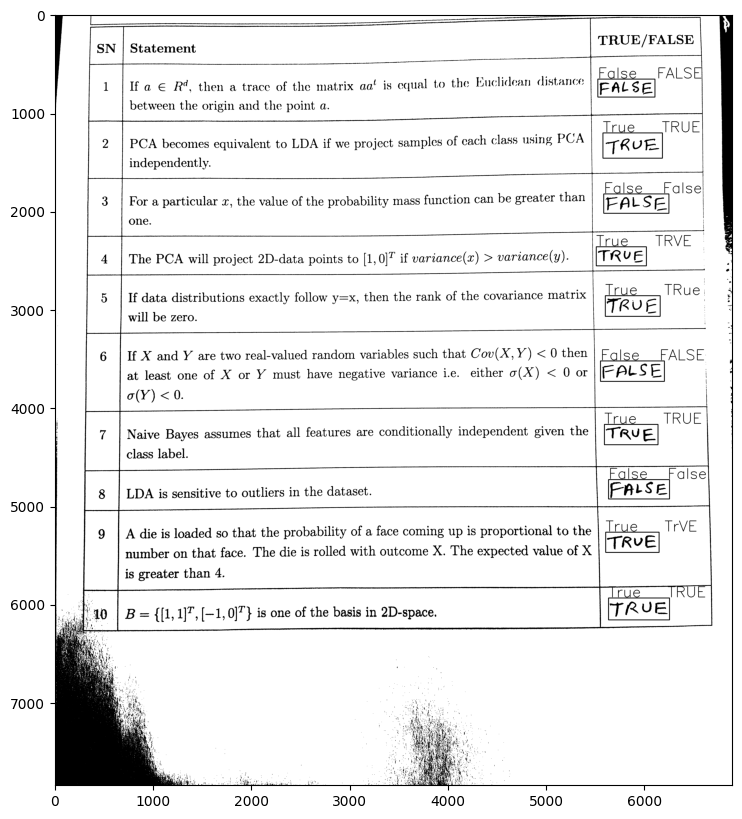

10 ['False', 'True', 'False', 'True', 'True', 'False', 'True', 'False', 'True', 'True']


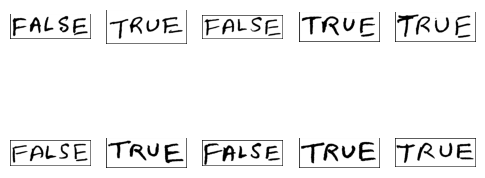

21


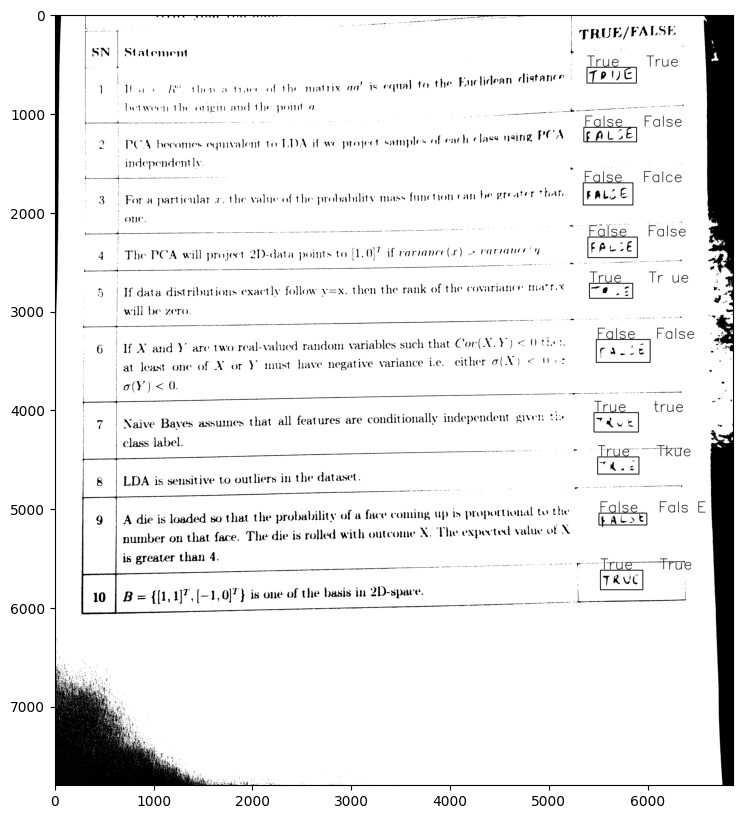

10 ['False', 'False', 'True', 'False', 'True', 'True', 'True', 'True', 'False', 'False']


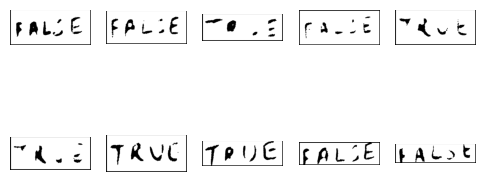

22


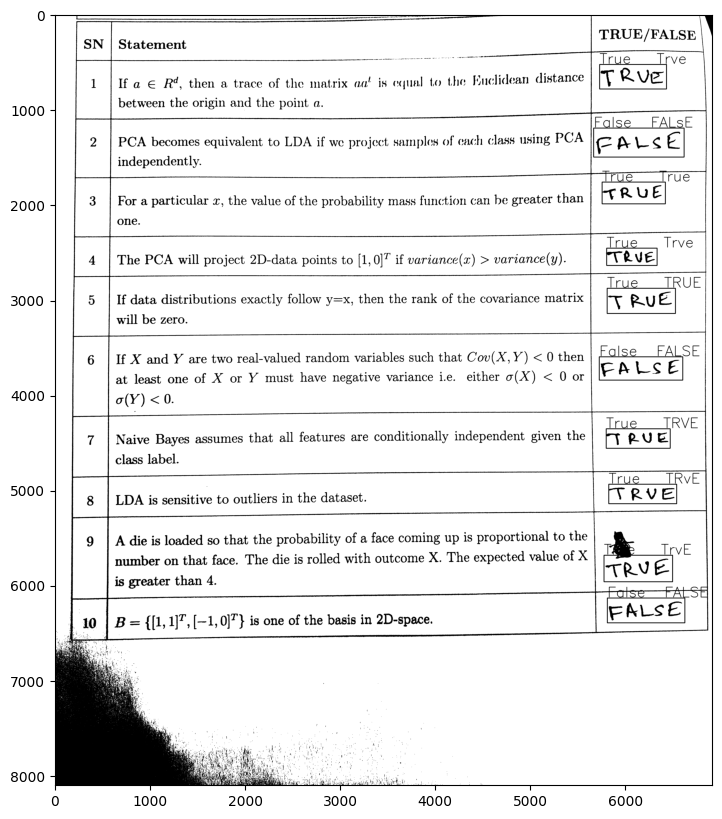

10 ['True', 'False', 'True', 'True', 'True', 'False', 'True', 'True', 'True', 'False']


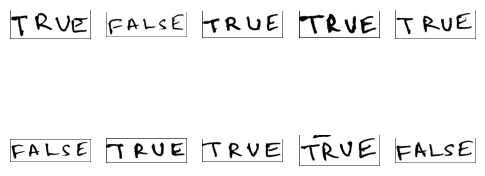

23


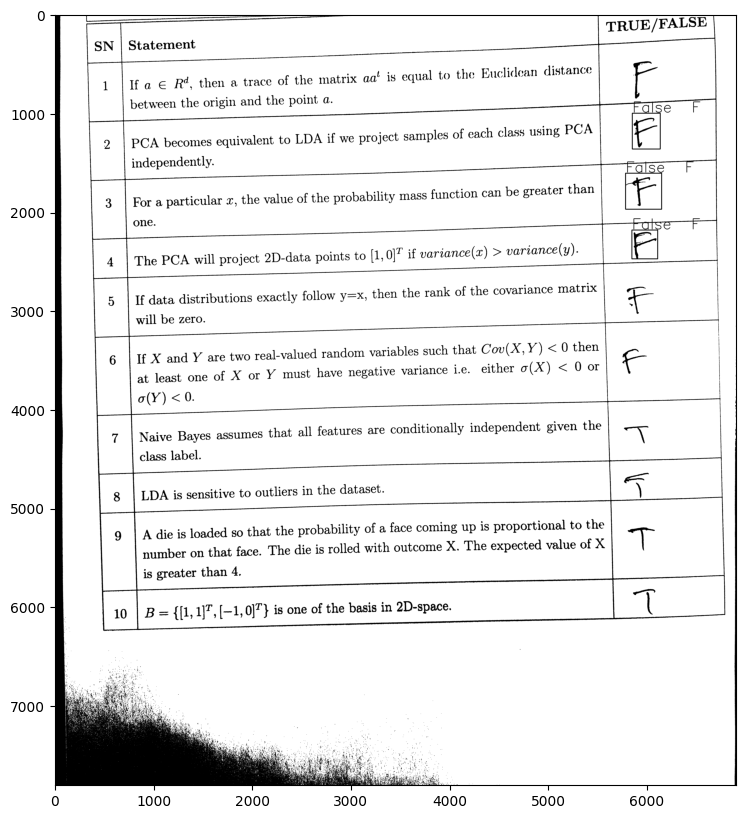

3 ['False', 'False', 'False']


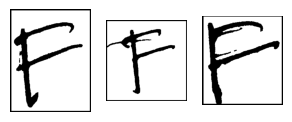

24


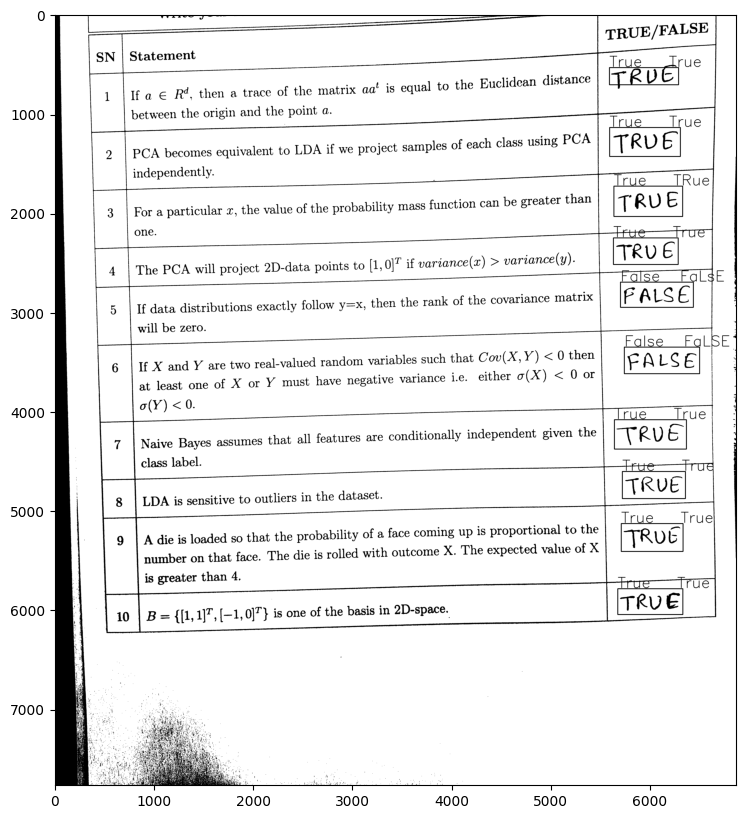

10 ['True', 'True', 'True', 'False', 'False', 'True', 'True', 'True', 'True', 'True']


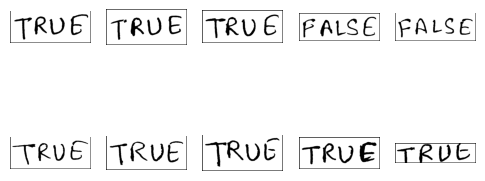

25


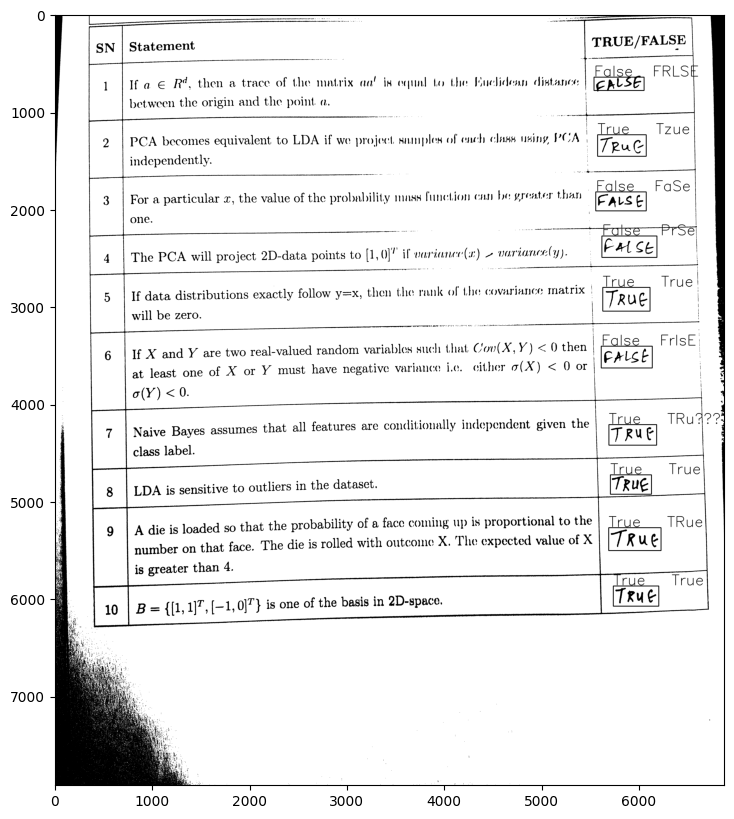

10 ['True', 'False', 'False', 'True', 'False', 'True', 'True', 'True', 'True', 'False']


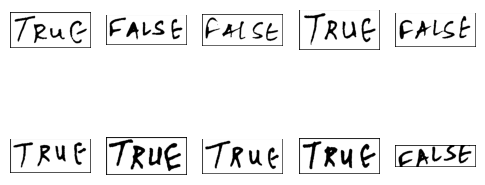

26


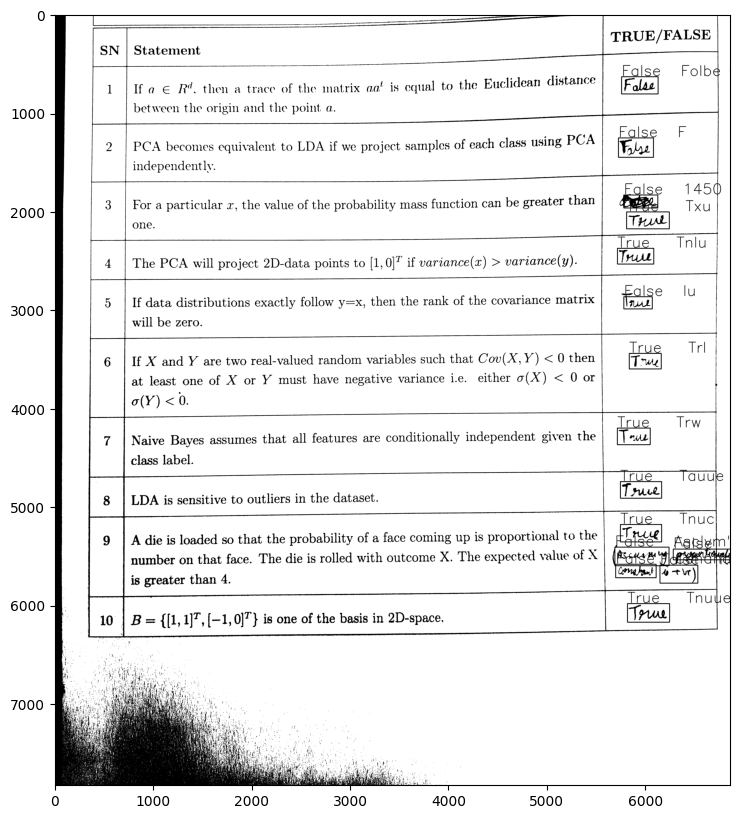

15 ['False', 'False', 'False', 'True', 'True', 'False', 'True', 'True', 'True', 'True', 'False', 'False', 'False', 'True', 'False']


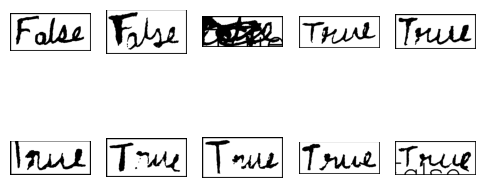

27


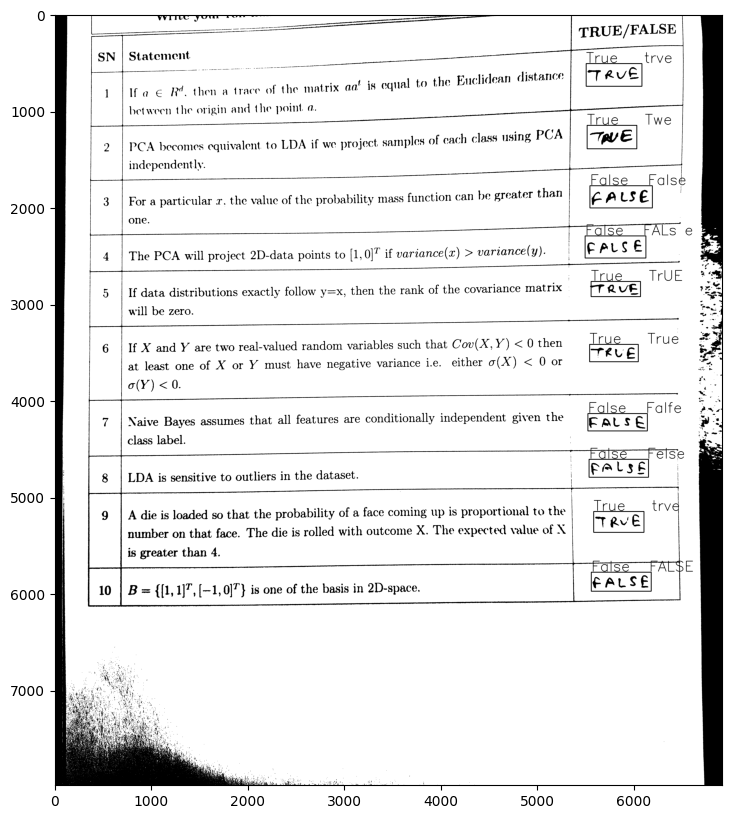

10 ['True', 'True', 'False', 'False', 'True', 'True', 'False', 'False', 'True', 'False']


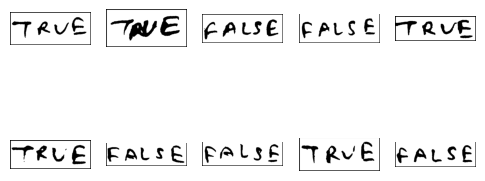

28


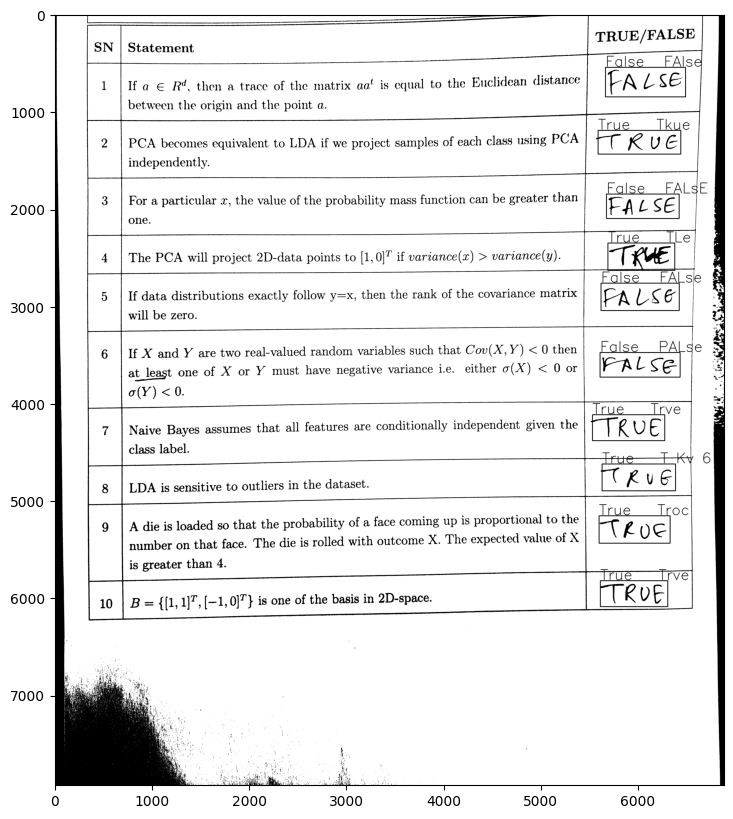

10 ['False', 'True', 'False', 'True', 'False', 'False', 'True', 'True', 'True', 'True']


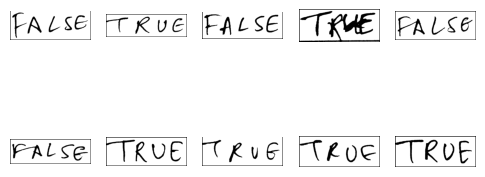

In [48]:
all_answers_images=[]
all_answers_text=[]
full_images=[]
for i in range(len(imgs)):
    image=imgs[i];
    path=arr[i];
    print(i+1)
    img,cur,text,bnd=extract_tf(image,path)
    all_answers_text.append(text)
    full_images.append(img)
    all_answers_images.append(cur)
    plt.figure(figsize=(10,10))
    plt.imshow(img,cmap='gray')
    plt.show()
    print(len(text),text)
    display_images(cur)


In [49]:
df=pd.DataFrame(all_answers_text)
df

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
0,True,True,True,True,True,False,True,True,False,True,None,None,None,None,None
1,False,True,True,False,True,True,True,False,True,True,None,None,None,None,None
2,True,False,True,False,False,False,False,True,True,True,None,None,None,None,None
3,False,False,False,False,True,True,True,False,True,True,None,None,None,None,None
4,False,False,False,False,False,False,False,False,False,False,None,None,None,None,None
5,True,False,False,False,True,False,True,True,True,True,None,None,None,None,None
6,True,True,False,False,True,False,True,True,False,False,None,None,None,None,None
7,False,False,True,True,None,None,None,None,None,None,None,None,None,None,None
8,False,False,True,False,False,True,False,True,True,True,None,None,None,None,None
9,False,False,False,True,False,False,True,False,False,True,None,None,None,None,None


In [ ]:
df.to_csv('test.csv')

In [50]:
pip install opencv-python

5890 125 5991 118
6566 931 6658 926
6464 1564 6554 1561
6444 2165 6574 2160
6482 2570 6626 2565
6281 3161 6404 3157
5793 3433 5889 3432
6486 3942 6633 3937
6426 4528 6524 4525
6116 4929 6211 4926
6364 5687 6470 5684
6300 6079 6450 6074
Detected Lines: [array([[5890,  125, 5991,  118]], dtype=int32), array([[6566,  931, 6658,  926]], dtype=int32), array([[6464, 1564, 6554, 1561]], dtype=int32), array([[6444, 2165, 6574, 2160]], dtype=int32), array([[6482, 2570, 6626, 2565]], dtype=int32), array([[6281, 3161, 6404, 3157]], dtype=int32), array([[5793, 3433, 5889, 3432]], dtype=int32), array([[6486, 3942, 6633, 3937]], dtype=int32), array([[6426, 4528, 6524, 4525]], dtype=int32), array([[6116, 4929, 6211, 4926]], dtype=int32), array([[6364, 5687, 6470, 5684]], dtype=int32), array([[6300, 6079, 6450, 6074]], dtype=int32)]


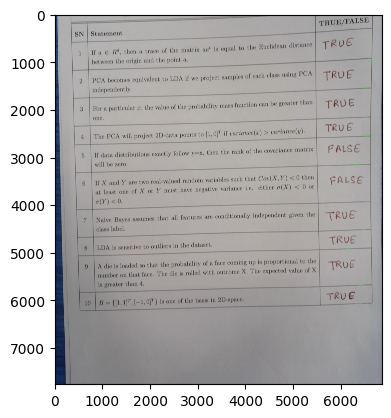

In [68]:
import cv2
import numpy as np

def detect_lines(image_path,bound):
    """
    Detect lines in an image using Hough Line Transform.

    Args:
    - image_path: Path to the input image.

    Returns:
    - image_with_lines: The image annotated with detected lines.
    - lines: The list of detected lines.
    """
    # Load the image
    image = cv2.imread(image_path)

    # Check if the image is loaded properly
    if image is None:
        raise ValueError(f"Image not found or could not be loaded from {image_path}")

    # Convert the image to grayscale if it's not already
    if len(image.shape) == 3:  # Check if the image has 3 channels (color image)
        gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    else:
        gray = image  # Image is already grayscale

    # Apply Canny edge detection
    edges = cv2.Canny(gray, 50, 150, apertureSize=3)

    # Detect lines using Hough Line Transform
    lines = cv2.HoughLinesP(edges, 1, np.pi / 180, threshold=90, minLineLength=90, maxLineGap=10)

    # Copy the original image to draw lines on it
    image_with_lines = image.copy()

    # Draw the lines on the image
    horizontal_lines = []
    if lines is not None:
        for line in lines:

            x1, y1, x2, y2 = line[0]
            if x1>bound:
                    angle = np.arctan2(y2 - y1, x2 - x1) * 180.0 / np.pi
                    # Consider lines with an angle close to 0 or 180 degrees as horizontal
                    if abs(angle) < 60 or abs(angle - 180) < 60:


                            horizontal_lines.append(line)

    horizontal_lines.sort(key=lambda line: line[0][1])

    # Filter out lines that are too close to each other
    filtered_horizontal_lines = []
    for i in range(len(horizontal_lines)):
        if i == 0:
            filtered_horizontal_lines.append(horizontal_lines[i])
        else:
            _, y1_prev, _, y2_prev = horizontal_lines[i - 1][0]
            _, y1_curr, _, y2_curr = horizontal_lines[i][0]
            if abs(y1_curr - y1_prev) >=200 and abs(y2_curr - y2_prev) >= 200:
                filtered_horizontal_lines.append(horizontal_lines[i])

    # Draw the filtered horizontal lines on the image
    for line in filtered_horizontal_lines:
        x1, y1, x2, y2 = line[0]
        print(x1,y1,x2,y2)
        cv2.line(image_with_lines, (x1, y1), (x2, y2), (0, 255, 0), 3)

    return image_with_lines, filtered_horizontal_lines



image_with_lines, lines = detect_lines(arr[23],bound)

# Display the image with lines


plt.imshow( image_with_lines)
cv2.waitKey(0)
cv2.destroyAllWindows()

print(f"Detected Lines: {lines}")

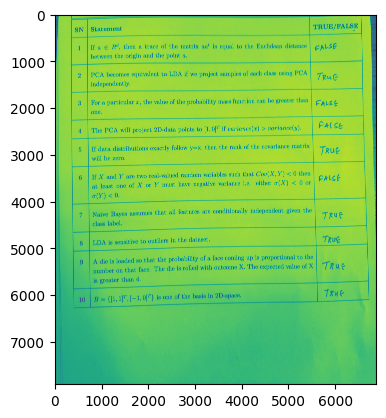